# **Exploratory data anaysis**

# **1. Science QA dataset**

### ScienceQA

1. Combined  21208
2. Train  12726
3. Valid  4241
4. Test   4241

## 1.1 Data preprocessing

Exclude rows with image on it

In [1]:
import pandas as pd

# 파일 경로
test_file_path = 'C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\Science_QA_dataset\\test_scienceqa.parquet'
train_file_path = 'C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\Science_QA_dataset\\train_scienceqa.parquet'
valid_file_path = 'C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\Science_QA_dataset\\validation_scienceqa.parquet'

# 데이터 로드
test_data_1 = pd.read_parquet(test_file_path)
train_data_1 = pd.read_parquet(train_file_path)
valid_data_1 = pd.read_parquet(valid_file_path)

# 이미지 데이터가 없는 항목(예: None, 빈 문자열 등) 필터링
test_data_1 = test_data_1[test_data_1['image'].isna() | (test_data_1['image'] == '')]
train_data_1 = train_data_1[train_data_1['image'].isna() | (train_data_1['image'] == '')]
valid_data_1 = valid_data_1[valid_data_1['image'].isna() | (valid_data_1['image'] == '')]

In [2]:
combined_data = pd.concat([train_data_1, valid_data_1, test_data_1])

In [3]:
#Science_QA_dataset
import pandas as pd

# Add a new column to each dataset to identify their origin
test_data_1['dataset'] = 'Test'
train_data_1['dataset'] = 'Train'
valid_data_1['dataset'] = 'Valid'

# Combine the datasets
combined_data = pd.concat([train_data_1, test_data_1, valid_data_1])

# Calculate the counts for each dataset
all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

# Create a DataFrame to display the counts
counts_df = pd.DataFrame({
    'Dataset': ['ScienceQA', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Display the counts as a table
print(counts_df)

     Dataset  Count
0  ScienceQA  10876
1      Train   6508
2      Valid   2144
3       Test   2224


In [17]:
import pandas as pd

test_data_1['dataset'] = 'Test'
train_data_1['dataset'] = 'Train'
valid_data_1['dataset'] = 'Valid'

# Combine the datasets
combined_data = pd.concat([train_data_1, test_data_1, valid_data_1])

# Calculate the counts for each dataset
all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

# Calculate the number of characters and tokens for each dataset
combined_data['num_characters'] = combined_data['question'].apply(len)
combined_data['num_tokens'] = combined_data['question'].apply(lambda x: len(x.split()))

# Group by dataset to get the average number of characters and tokens
summary_stats = combined_data.groupby('dataset').agg({
    'num_characters': 'mean',
    'num_tokens': 'mean'
}).reset_index()

# Include the overall dataset statistics
overall_stats = combined_data.agg({
    'num_characters': 'mean',
    'num_tokens': 'mean'
}).rename({'num_characters': 'mean_num_characters', 'num_tokens': 'mean_num_tokens'})

overall_stats['dataset'] = 'ScienceQA'
overall_stats_df = pd.DataFrame([overall_stats])

# Adjust the summary_stats DataFrame to match the required format
summary_stats = summary_stats.rename(columns={'dataset': 'Dataset'})
overall_stats_df = overall_stats_df.rename(columns={'dataset': 'Dataset', 'mean_num_characters': 'num_characters', 'mean_num_tokens': 'num_tokens'})

# Create a DataFrame to display the counts
counts_df = pd.DataFrame({
    'Dataset': ['ScienceQA', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Merge counts with summary statistics
final_df = counts_df.merge(pd.concat([overall_stats_df, summary_stats]), on='Dataset', how='left')
final_df.head()

,Dataset,Count,num_characters,num_tokens
0,ScienceQA,10876,83.149687,14.589187
1,Train,6508,84.291180,14.778580
2,Valid,2144,78.674440,13.830690
3,Test,2224,84.123651,14.766187


In [12]:
import pandas as pd

test_data_1['dataset'] = 'Test'
train_data_1['dataset'] = 'Train'
valid_data_1['dataset'] = 'Valid'

# Combine the datasets
combined_data = pd.concat([train_data_1, test_data_1, valid_data_1])

# Calculate the counts for each dataset
all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

# Calculate the number of characters and tokens for each dataset
combined_data['num_characters'] = combined_data['question'].apply(len)
combined_data['num_tokens'] = combined_data['question'].apply(lambda x: len(x.split()))

# Group by dataset to get the average number of characters and tokens
summary_stats = combined_data.groupby('dataset').agg({
    'num_characters': 'mean',
    'num_tokens': 'mean'
}).reset_index()

# Include the overall dataset statistics
overall_stats = combined_data.agg({
    'num_characters': 'mean',
    'num_tokens': 'mean'
}).rename({'num_characters': 'mean_num_characters', 'num_tokens': 'mean_num_tokens'})

overall_stats['dataset'] = 'ScienceQA'
overall_stats_df = pd.DataFrame([overall_stats])

# Adjust the summary_stats DataFrame to match the required format
summary_stats = summary_stats.rename(columns={'dataset': 'Dataset'})
overall_stats_df = overall_stats_df.rename(columns={'dataset': 'Dataset', 'mean_num_characters': 'num_characters', 'mean_num_tokens': 'num_tokens'})

# Create a DataFrame to display the counts
counts_df = pd.DataFrame({
    'Dataset': ['ScienceQA', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Merge counts with summary statistics
final_df = counts_df.merge(pd.concat([overall_stats_df, summary_stats]), on='Dataset', how='left')
final_df.head()

,Dataset,Count,num_characters,num_tokens
0,ScienceQA,10876,83.149687,14.589187
1,Train,6508,84.291180,14.778580
2,Valid,2144,78.674440,13.830690
3,Test,2224,84.123651,14.766187


In [8]:
import pandas as pd

# Add a new column to each dataset to identify their origin
test_data_1['dataset'] = 'Test'
train_data_1['dataset'] = 'Train'
valid_data_1['dataset'] = 'Valid'

# Combine the datasets
combined_data = pd.concat([train_data_1, test_data_1, valid_data_1])

all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

combined_data['num_characters'] = combined_data['question'].apply(len)
combined_data['num_tokens'] = combined_data['question'].apply(lambda x: len(x.split()))

summary_stats = combined_data.groupby('dataset').agg({
    'num_characters': 'sum',
    'num_tokens': 'sum'
}).reset_index()

# Calculate the overall dataset statistics
overall_stats = combined_data.agg({
    'num_characters': 'sum',
    'num_tokens': 'sum'
}).rename({'num_characters': 'total_num_characters', 'num_tokens': 'total_num_tokens'})

overall_stats['dataset'] = 'ScienceQA'
overall_stats_df = pd.DataFrame([overall_stats])

# Rename the dataset column to 'Dataset' for consistency
summary_stats = summary_stats.rename(columns={'dataset': 'Dataset'})
overall_stats_df = overall_stats_df.rename(columns={'dataset': 'Dataset', 'total_num_characters': 'num_characters', 'total_num_tokens': 'num_tokens'})

# Create a DataFrame to display the counts
counts_df = pd.DataFrame({
    'Dataset': ['ScienceQA', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Merge counts with summary statistics
final_df = counts_df.merge(pd.concat([overall_stats_df, summary_stats]), on='Dataset', how='left')

print(final_df)

     Dataset  Count  num_characters  num_tokens
0  ScienceQA  10876          904336      158672
1      Train   6508          548567       96179
2      Valid   2144          168678       29653
3       Test   2224          187091       32840


In [4]:
combined_data = pd.concat([train_data_1, test_data_1, valid_data_1])

## **1.1 Box plot of Combined, train, valid, test dataset in ScienceQA**

In [5]:
combined_data.head()

,image,question,choices,answer,hint,task,grade,subject,topic,category,skill,lecture,solution,dataset
3,None,Which tense does the sentence use?\nMona will ...,"[present tense, future tense, past tense]",1,,closed choice,grade2,language science,verbs,Verb tense,"Is the sentence in the past, present, or futur...",Present tense verbs tell you about something t...,The sentence is in future tense. You can tell ...,Train
4,None,Complete the sentence.\nSewing an apron is a ().,"[chemical change, physical change]",1,,closed choice,grade4,natural science,chemistry,Physical and chemical change,Identify physical and chemical changes,Chemical changes and physical changes are two ...,Sewing an apron is a physical change. The fabr...,Train
5,None,Which of the following contains a vague pronou...,[Steven's brother Jim wondered whether he ran ...,0,,closed choice,grade11,language science,writing-strategies,Pronouns,Identify vague pronoun references,"When writing, make sure to avoid vague pronoun...",The first answer choice contains a vague prono...,Train
8,None,What do these two changes have in common?\ntea...,"[Both are only physical changes., Both are che...",0,,closed choice,grade4,natural science,chemistry,Physical and chemical change,Compare physical and chemical changes,Chemical changes and physical changes are two ...,Step 1: Think about each change.\nTearing a pi...,Train
12,None,What is the volume of a large soup pot?,"[7 liters, 7 milliliters]",0,Select the better estimate.,closed choice,grade5,natural science,units-and-measurement,Units and measurement,Choose metric units of volume,Measurements are written with both a number an...,The better estimate for the volume of a large ...,Train


In [6]:
combined_data['hint_length'] = combined_data['hint'].apply(lambda x: len(x))

In [7]:
combined_data = combined_data[combined_data['hint_length'] > 0]

In [8]:
import matplotlib.pyplot as plt

# Combined question and hint length
combined_data['question_length'] = combined_data['question'].apply(lambda x: len(x))
combined_data['hint_length'] = combined_data['hint'].apply(lambda x: len(x))

# train, test, validation question length
train_data_1['question_length'] = train_data_1['question'].apply(len)
test_data_1['question_length'] = test_data_1['question'].apply(len)
valid_data_1['question_length'] = valid_data_1['question'].apply(len)

# train, test, validation hint length
train_data_1['hint_length'] = train_data_1['hint'].apply(len)
test_data_1['hint_length'] = test_data_1['hint'].apply(len)
valid_data_1['hint_length'] = valid_data_1['hint'].apply(len)

In [9]:
combined_data = combined_data[combined_data['hint_length'] > 0]

train_data_1 = train_data_1[train_data_1['hint_length'] > 0]

test_data_1 = test_data_1[test_data_1['hint_length'] > 0]

valid_data_1 = valid_data_1[valid_data_1['hint_length'] > 0]

In [10]:
# Calculate the counts for each dataset
all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

# Create a DataFrame to display the counts
counts_df = pd.DataFrame({
    'Dataset': ['ScienceQA', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Display the counts as a table
print(counts_df)

     Dataset  Count
0  ScienceQA   3688
1      Train   2135
2      Valid    764
3       Test    789


In [11]:
# Create data list of ScienceQa
data_to_plot_qa_1 = [combined_data['question_length'], train_data_1['question_length'], test_data_1['question_length'], valid_data_1['question_length']]
data_to_plot_sol_1 = [combined_data['hint_length'], train_data_1['hint_length'], test_data_1['hint_length'], valid_data_1['hint_length']]

Box plot of question lengths in Science QA dataset


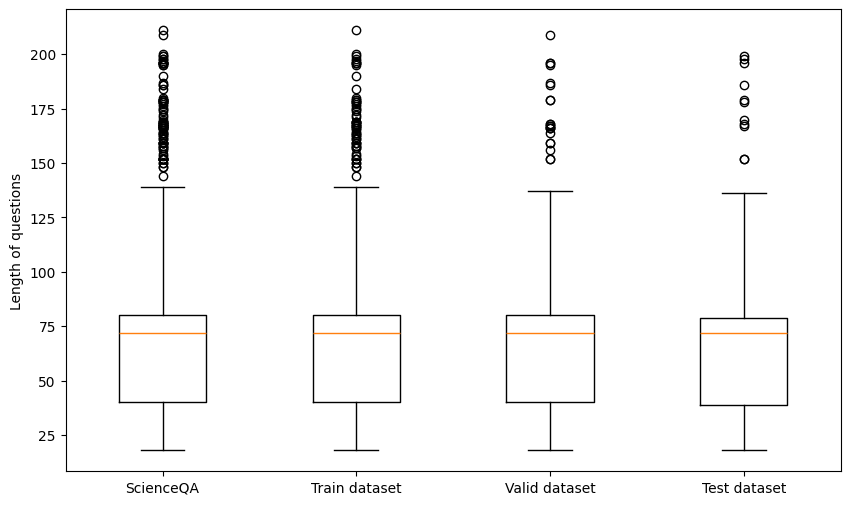

In [12]:
#Question length box plot
print('Box plot of question lengths in Science QA dataset')
plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot_qa_1)
plt.ylabel('Length of questions')
plt.xticks([1, 2, 3, 4], ['ScienceQA', 'Train dataset', 'Valid dataset','Test dataset'])
plt.show()

Box plot of hint lengths in Science QA dataset


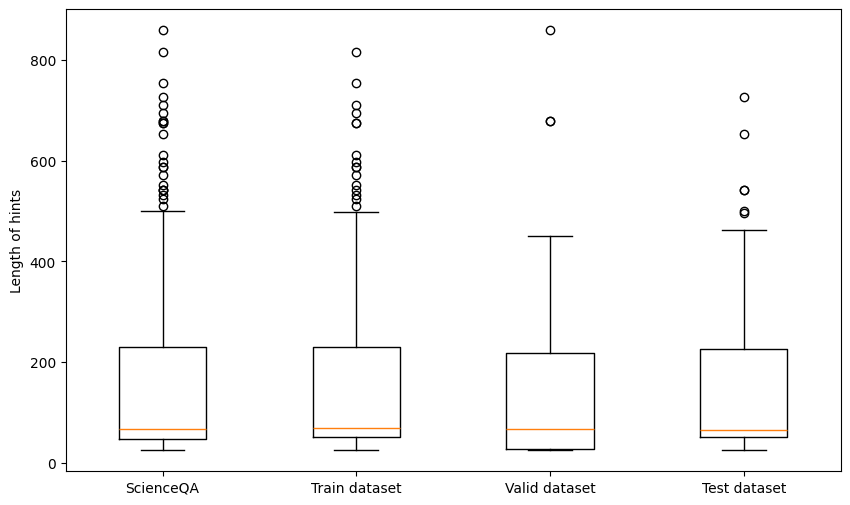

In [13]:
#hint length box plot
print(('Box plot of hint lengths in Science QA dataset'))
plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot_sol_1)
plt.ylabel('Length of hints')
plt.xticks([1, 2, 3, 4], ['ScienceQA', 'Train dataset', 'Valid dataset', 'Test dataset'])
plt.show()

In [14]:
length_all_qa_1 = combined_data['question_length'].describe()
median_sol_qa_1 = combined_data['question_length'].median()

print("Question length of combined dataset of Science QA")
print(length_all_qa_1)
print(f"Median: {median_sol_qa_1}")

Question length of combined dataset of Science QA
count    3688.000000
mean       64.646692
std        29.200404
min        18.000000
25%        40.000000
50%        72.000000
75%        80.000000
max       211.000000
Name: question_length, dtype: float64
Median: 72.0


In [15]:
# Calculate descriptive statistics for hint length
length_all_sol_1 = combined_data['hint_length'].describe()
median_sol = combined_data['hint_length'].median()

print("hint length of combined dataset of Science QA")
print(length_all_sol_1)
print(f"Median: {median_sol}")

hint length of combined dataset of Science QA
count    3688.000000
mean      142.097614
std       135.983541
min        25.000000
25%        48.000000
50%        68.000000
75%       230.000000
max       859.000000
Name: hint_length, dtype: float64
Median: 68.0


In [16]:
length_tr_qa_1 = train_data_1['question_length'].describe()
median_qa_train = train_data_1['question_length'].median()

print("Question length of Science QA train dataset")

print(length_tr_qa_1)
print(f"Median: {median_qa_train}")

Question length of Science QA train dataset
count    2135.000000
mean       65.311475
std        29.608409
min        18.000000
25%        40.000000
50%        72.000000
75%        80.000000
max       211.000000
Name: question_length, dtype: float64
Median: 72.0


In [17]:
# Calculate descriptive statistics for hint length
length_tr_sol_1 = train_data_1['hint_length'].describe()
median_tr_sol = train_data_1['hint_length'].median()

print("hint length of trained dataset of Science QA")
print(length_tr_sol_1)
print(f"Median: {median_tr_sol}")

hint length of trained dataset of Science QA
count    2135.000000
mean      142.998126
std       135.857059
min        25.000000
25%        52.000000
50%        69.000000
75%       231.000000
max       815.000000
Name: hint_length, dtype: float64
Median: 69.0


In [18]:
length_test_qa_1 = test_data_1['question_length'].describe()
median_qa_test = test_data_1['question_length'].median()

print("Question length of Science QA test dataset")

print(length_test_qa_1)
print(f"Median: {median_qa_test}")

Question length of Science QA test dataset
count    789.000000
mean      64.470215
std       29.526778
min       18.000000
25%       40.000000
50%       72.000000
75%       80.000000
max      209.000000
Name: question_length, dtype: float64
Median: 72.0


In [19]:
# Calculate descriptive statistics for hint length
length_test_hint_1 = test_data_1['hint_length'].describe()
median_hint_sol = test_data_1['hint_length'].median()

print("hint length of test dataset of Science QA")
print(length_test_hint_1)
print(f"Median: {median_hint_sol}")

hint length of test dataset of Science QA
count    789.000000
mean     141.291508
std      136.984497
min       25.000000
25%       27.000000
50%       67.000000
75%      219.000000
max      859.000000
Name: hint_length, dtype: float64
Median: 67.0


In [20]:
length_val_qa_1 = valid_data_1['question_length'].describe()
median_qa_val = valid_data_1['question_length'].median()

print("Question length of Science QA valid dataset")

print(length_val_qa_1)
print(f"Median: {median_qa_val}")

Question length of Science QA valid dataset
count    764.000000
mean      62.971204
std       27.639018
min       18.000000
25%       39.000000
50%       72.000000
75%       79.000000
max      199.000000
Name: question_length, dtype: float64
Median: 72.0


In [21]:
# Calculate descriptive statistics for hint length
length_val_sol_1 = valid_data_1['hint_length'].describe()
median_val_sol = valid_data_1['hint_length'].median()

print("hint length of validation dataset of Science QA")
print(length_val_sol_1)
print(f"Median: {median_val_sol}")

hint length of validation dataset of Science QA
count    764.000000
mean     140.413613
std      135.455512
min       25.000000
25%       50.750000
50%       66.000000
75%      227.000000
max      726.000000
Name: hint_length, dtype: float64
Median: 66.0


Combined Data:
Generating word cloud for all subjects in Combined Data


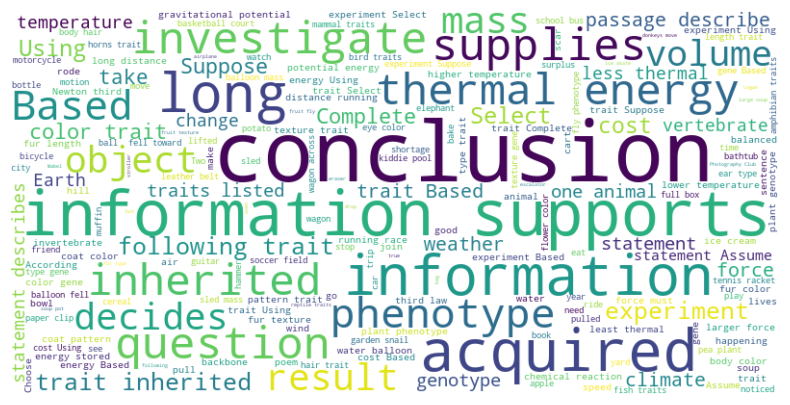

Generating word cloud for subject named natural science in Combined Data


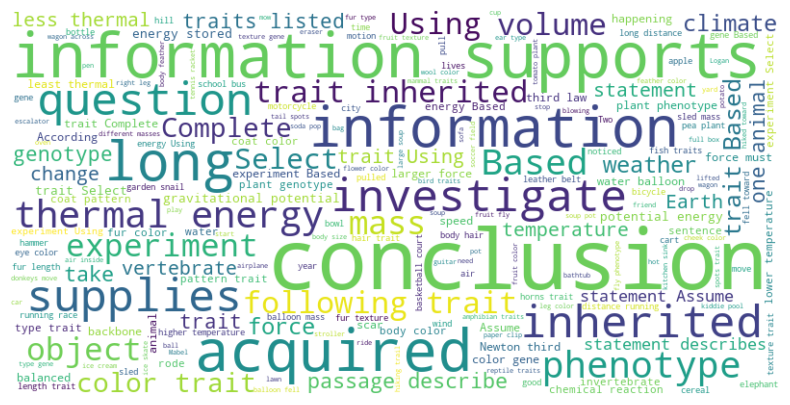

Generating word cloud for subject named social science in Combined Data


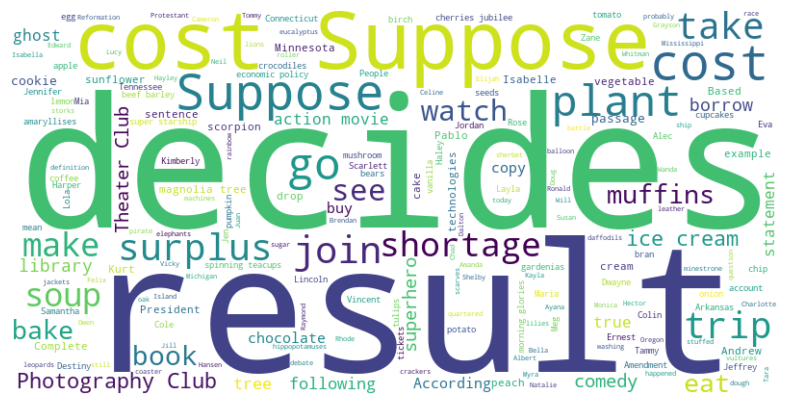

Generating word cloud for subject named language science in Combined Data


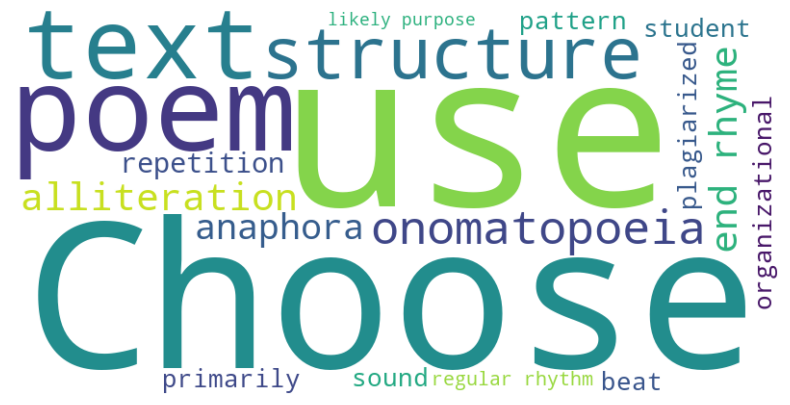

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Function to generate a combined word cloud for all subjects
def generate_combined_word_cloud(data, data_name, column='question'):
    print(f"Generating word cloud for all subjects in {data_name}")
    text = ' '.join(data[column].astype(str).tolist())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Wordcloud of 'Question' column for each subject
def generate_word_clouds(data, data_name, column='question'):
    subjects = data['subject'].unique()
    for subject in subjects:
        print(f"Generating word cloud for subject named {subject} in {data_name}")
        text = ' '.join(data[data['subject'] == subject][column].astype(str).tolist())
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.show()

# Generate word clouds for the 'question' column in each dataset
print("Combined Data:")
generate_combined_word_cloud(combined_data, "Combined Data")
generate_word_clouds(combined_data, "Combined Data")

Train Data:
Generating word cloud for all subjects in Train Data


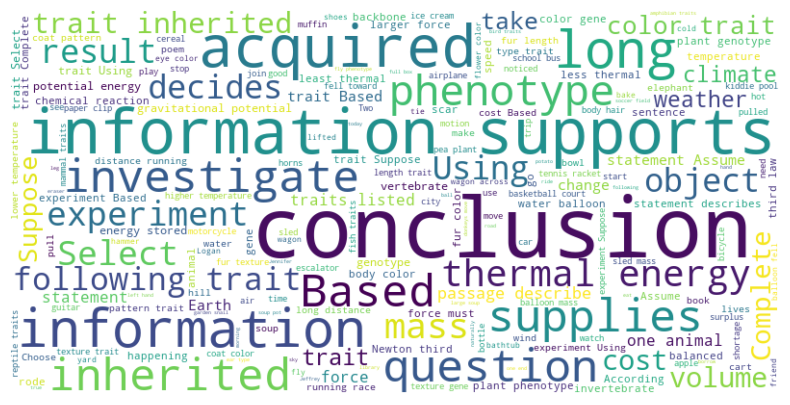

Generating word cloud for subject named natural science in Train Data


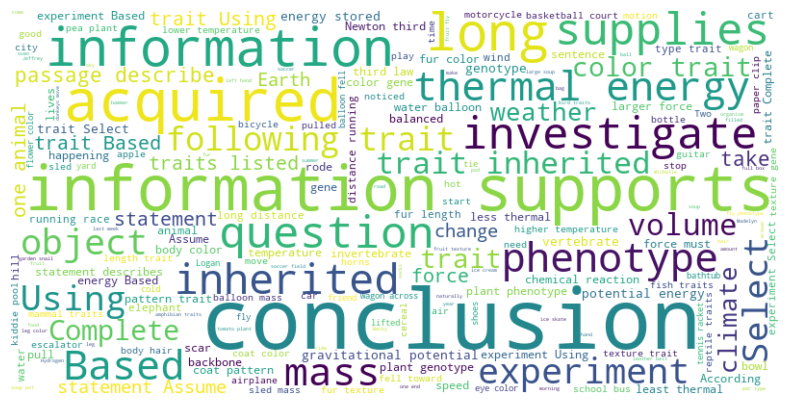

Generating word cloud for subject named social science in Train Data


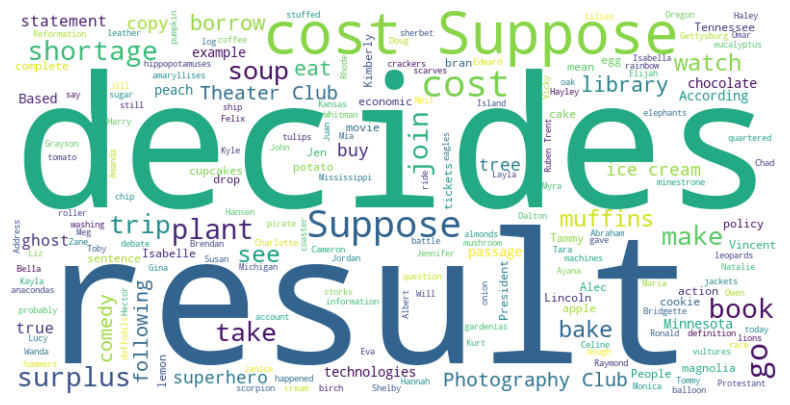

Generating word cloud for subject named language science in Train Data


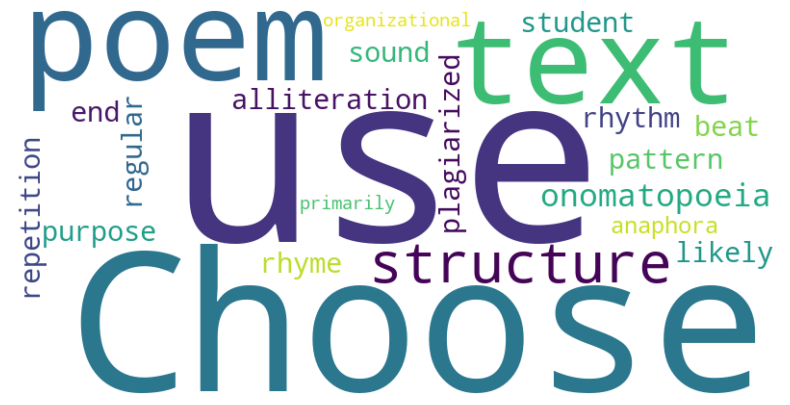

In [23]:
# Generate word clouds for the 'question' column in each dataset
print("Train Data:")

generate_combined_word_cloud(train_data_1,"Train Data")
generate_word_clouds(train_data_1, "Train Data")

Test data
Generating word cloud for all subjects in Test Data


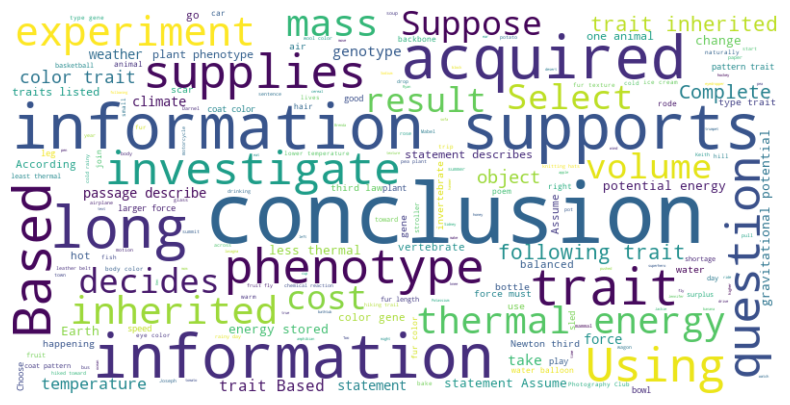

Generating word cloud for subject named natural science in Test Data


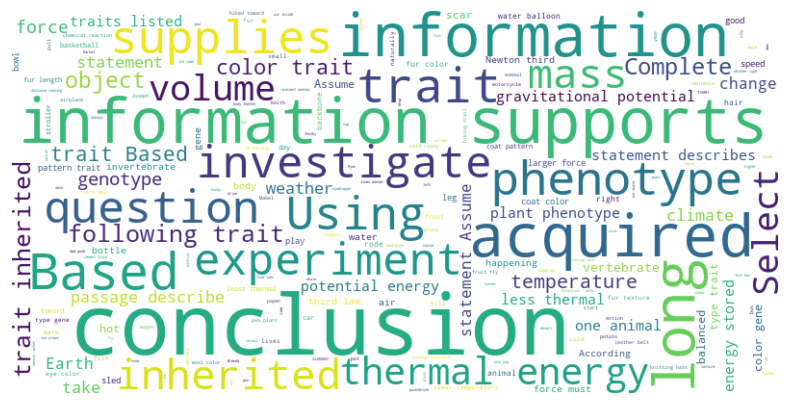

Generating word cloud for subject named social science in Test Data


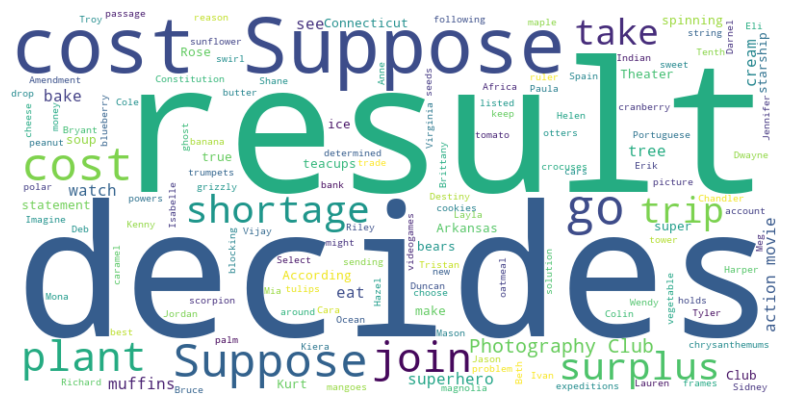

Generating word cloud for subject named language science in Test Data


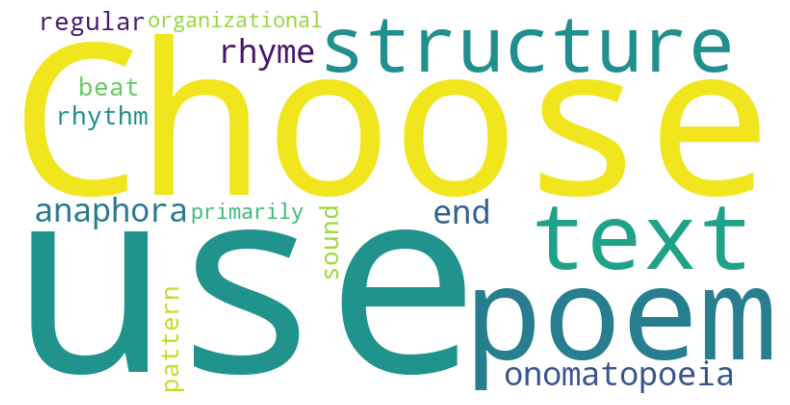

In [24]:
print("Test data")
generate_combined_word_cloud(test_data_1,"Test Data")
generate_word_clouds(test_data_1, "Test Data")

Validation data
Generating word cloud for all subjects in Validation Data


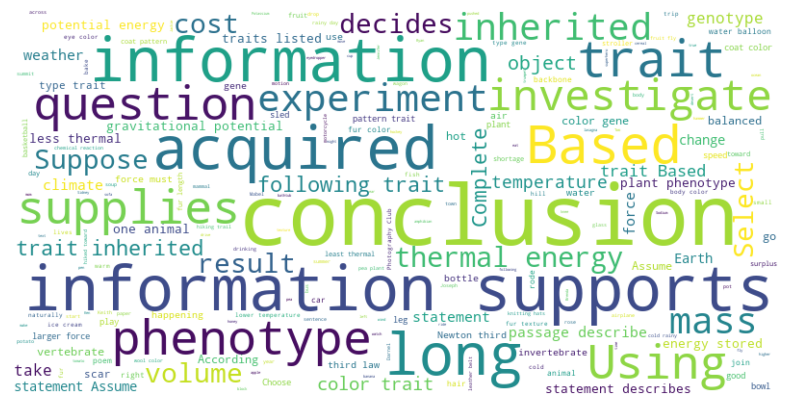

Generating word cloud for subject named natural science in Validation Data


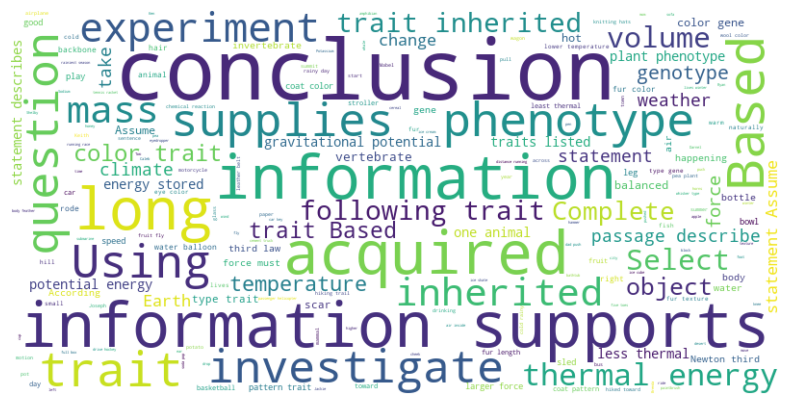

Generating word cloud for subject named social science in Validation Data


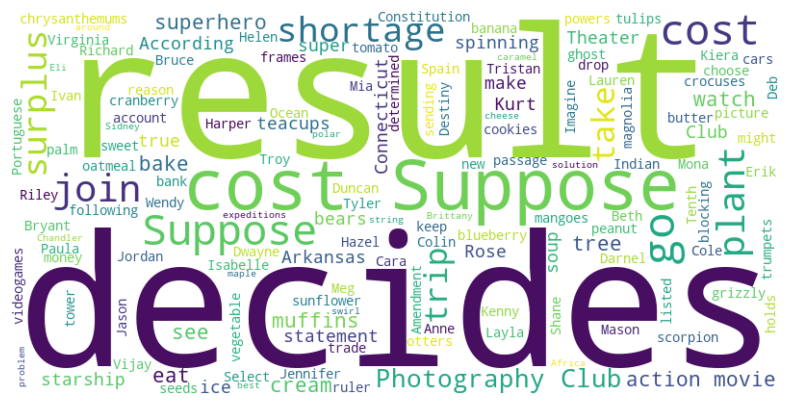

Generating word cloud for subject named language science in Validation Data


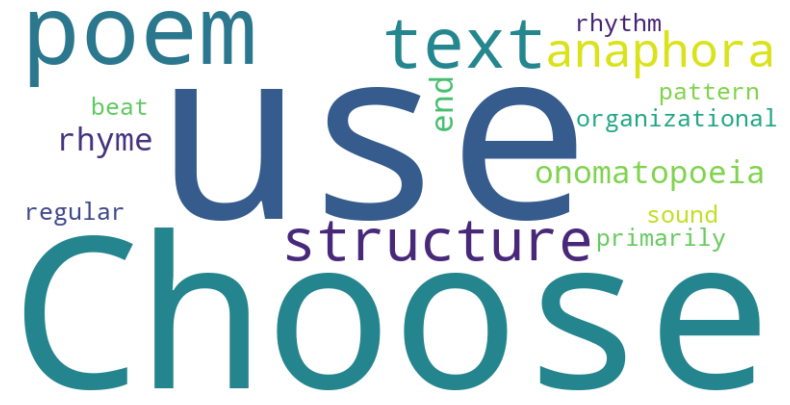

In [25]:
print("Validation data")
generate_combined_word_cloud(test_data_1,"Validation Data")
generate_word_clouds(test_data_1, "Validation Data")

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_base.py:949: FutureWarning: When grouping wit

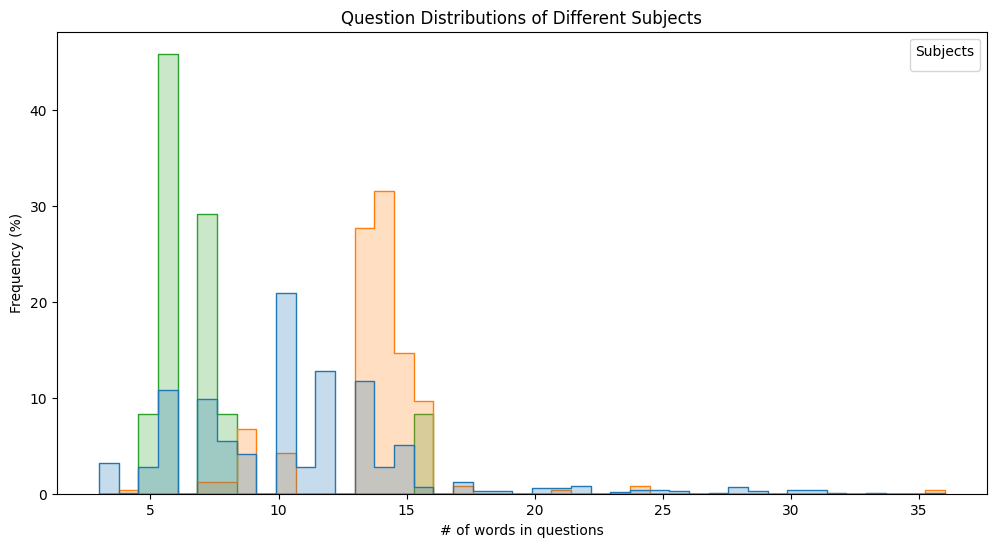

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the length of each question
combined_data['question_length'] = combined_data['question'].apply(lambda x: len(x.split()))

# Plot the distribution of question lengths for each subject
plt.figure(figsize=(12, 6))
sns.histplot(data=combined_data, x='question_length', hue='subject', element='step', stat='percent', common_norm=False)

plt.xlabel('# of words in questions')
plt.ylabel('Frequency (%)')
plt.title('Question Distributions of Different Subjects')
plt.legend(title='Subjects')
plt.show()

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_base.py:949: FutureWarning: When grouping wit

Question Distributions of Different Subjects


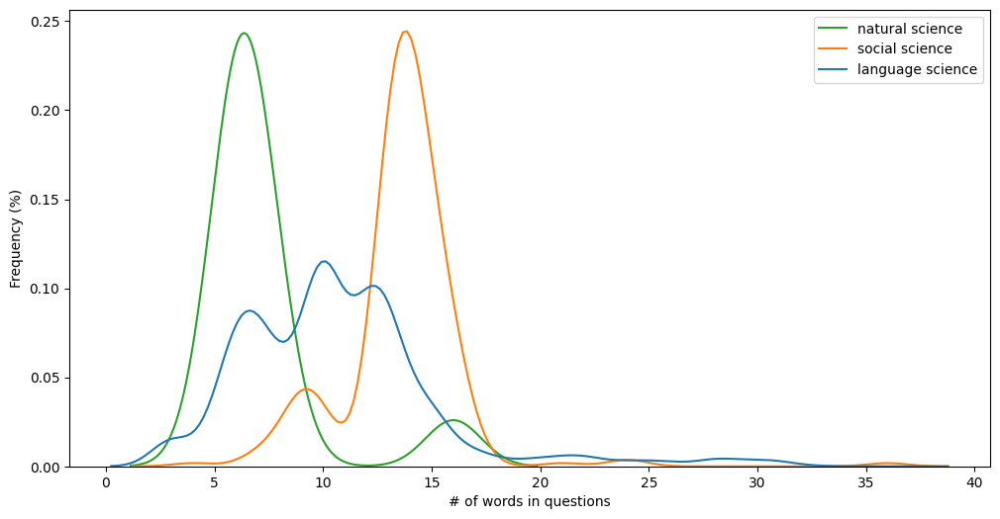

In [27]:
# Plot without title of the distribution of question lengths for each subject using line plots
print('Question Distributions of Different Subjects')

plt.figure(figsize=(12, 6))
sns.kdeplot(data=combined_data, x='question_length', hue='subject', common_norm=False)

plt.xlabel('# of words in questions')
plt.ylabel('Frequency (%)')
plt.legend(loc='upper right', labels=combined_data['subject'].unique())
plt.show()

In [28]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from gensim.corpora.dictionary import Dictionary
from gensim.models import LdaModel
import pyLDAvis.gensim_models
import pyLDAvis
import os

# extract text data
texts = train_data_1['question'].tolist() + test_data_1['question'].tolist() + valid_data_1['question'].tolist()

# Download nltk
nltk.download('punkt')
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Text preprocessing function
def preprocess(text):
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    tokens = [word for word in tokens if len(word) > 2]
    return tokens

processed_texts = [preprocess(text) for text in texts]

dictionary = Dictionary(processed_texts)
corpus = [dictionary.doc2bow(text) for text in processed_texts]

# LdaModel
lda_model = LdaModel(corpus, num_topics=10, id2word=dictionary, passes=15)

# Visulalize the result 
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(vis)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [29]:
import pandas as pd
from bertopic import BERTopic

test_file_path = 'C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\Science_QA_dataset\\test_scienceqa.parquet'
train_file_path = 'C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\Science_QA_dataset\\train_scienceqa.parquet'
valid_file_path = 'C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\Science_QA_dataset\\validation_scienceqa.parquet'

test_data = pd.read_parquet(test_file_path)
train_data = pd.read_parquet(train_file_path)
valid_data = pd.read_parquet(valid_file_path)

texts = train_data['question'].tolist() + test_data['question'].tolist() + valid_data['question'].tolist()

# BERTopic model
topic_model = BERTopic(calculate_probabilities=True)
topics, probs = topic_model.fit_transform(texts)

print(topic_model.get_topic_info())

print(topic_model.get_topic(0))

topic_model.visualize_topics().show()

document_index = 0 

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


     Topic  Count                                   Name  \
0       -1   1325         -1_fallacy_logical_used_figure   
1        0    705          0_guide_dictionary_page_words   
2        1    599       1_magnetic_pair_think_statements   
3        2    470         2_country_highlighted_which_is   
4        3    350                3_changes_two_common_do   
..     ...    ...                                    ...   
472    471     11    471_cain_insistence_shortcut_taking   
473    472     11  472_exclaimed_speedy_internet_waiting   
474    473     11         473_grabbing_prey_feet_animals   
475    474     11      474_strolled_devil_speak_declared   
476    475     10         475_test_show_could_valentinas   

                                        Representation  \
0    [fallacy, logical, used, figure, speech, text,...   
1    [guide, dictionary, page, words, find, would, ...   
2    [magnetic, pair, think, statements, between, f...   
3    [country, highlighted, which, is, macedoni

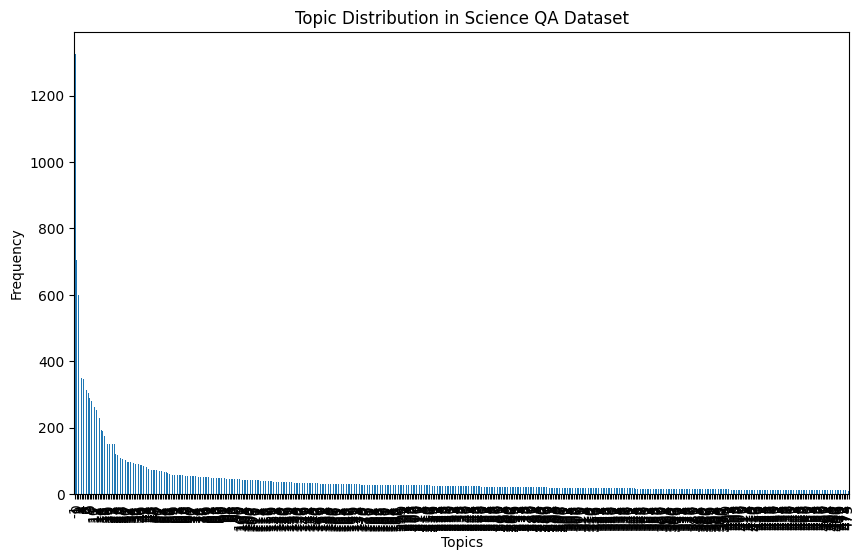

In [30]:
import matplotlib.pyplot as plt

topic_counts = pd.Series(topics).value_counts()

plt.figure(figsize=(10, 6))
topic_counts.plot(kind='bar')
plt.title('Topic Distribution in Science QA Dataset')
plt.xlabel('Topics')
plt.ylabel('Frequency')
plt.show()

# **2. Sciq Dataset**

## **2.1 Data Load**

In [31]:
import pandas as pd

# Data load
test_data = pd.read_json('C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\SciQ dataset-2 3\\test.json')
train_data = pd.read_json('C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\SciQ dataset-2 3\\train.json')
valid_data = pd.read_json('C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\SciQ dataset-2 3\\valid.json')

In [32]:
train_data.head()

,question,distractor3,distractor1,distractor2,correct_answer,support
0,What type of organism is commonly used in prep...,viruses,protozoa,gymnosperms,mesophilic organisms,"Mesophiles grow best in moderate temperature, ..."
1,What phenomenon makes global winds blow northe...,tropical effect,muon effect,centrifugal effect,coriolis effect,Without Coriolis Effect the global winds would...
2,Changes from a less-ordered state to a more-or...,endothermic,unbalanced,reactive,exothermic,Summary Changes of state are examples of phase...
3,What is the least dangerous radioactive decay?,zeta decay,beta decay,gamma decay,alpha decay,All radioactive decay is dangerous to living t...
4,Kilauea in hawaii is the world’s most continuo...,magma,greenhouse gases,carbon and smog,smoke and ash,Example 3.5 Calculating Projectile Motion: Hot...


In [15]:
import pandas as pd

# Data load
test_data = pd.read_json('C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\SciQ dataset-2 3\\test.json')
train_data = pd.read_json('C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\SciQ dataset-2 3\\train.json')
valid_data = pd.read_json('C:\\Users\\User\\Desktop\\HJL\\Toronto_winter_session_Study\\MITProject\\SciQ dataset-2 3\\valid.json')

# Add a new column to each dataset to identify their origin
test_data['dataset'] = 'Test'
train_data['dataset'] = 'Train'
valid_data['dataset'] = 'Valid'

# Combine the datasets
combined_data = pd.concat([train_data, test_data, valid_data])

# Calculate the counts for each dataset
all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

# Calculate the number of characters and tokens for each dataset
combined_data['num_characters'] = combined_data['question'].apply(len)
combined_data['num_tokens'] = combined_data['question'].apply(lambda x: len(x.split()))

# Group by dataset to get the average number of characters and tokens
summary_stats = combined_data.groupby('dataset').agg({
    'num_characters': 'mean',
    'num_tokens': 'mean'
}).reset_index()

# Include the overall dataset statistics
overall_stats = combined_data.agg({
    'num_characters': 'mean',
    'num_tokens': 'mean'
}).rename({'num_characters': 'mean_num_characters', 'num_tokens': 'mean_num_tokens'})

overall_stats['dataset'] = 'SciQ'
overall_stats_df = pd.DataFrame([overall_stats])

# Adjust the summary_stats DataFrame to match the required format
summary_stats = summary_stats.rename(columns={'dataset': 'Dataset'})
overall_stats_df = overall_stats_df.rename(columns={'dataset': 'Dataset', 'mean_num_characters': 'num_characters', 'mean_num_tokens': 'num_tokens'})

# Create a DataFrame to display the counts
counts_df = pd.DataFrame({
    'Dataset': ['SciQ', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Merge counts with summary statistics
final_df = counts_df.merge(pd.concat([overall_stats_df, summary_stats]), on='Dataset', how='left')

# Display the final table
print(final_df)

  Dataset  Count  num_characters  num_tokens
0    SciQ  13679       76.148987   12.897288
1   Train  11679       76.009932   12.867112
2   Valid   1000       78.039000   13.225000
3    Test   1000       75.883000   12.922000


## **2.2 Generate wordcloud of SciQ dataset**

Combined Data:
Generating word cloud for all subjects in Combined Data


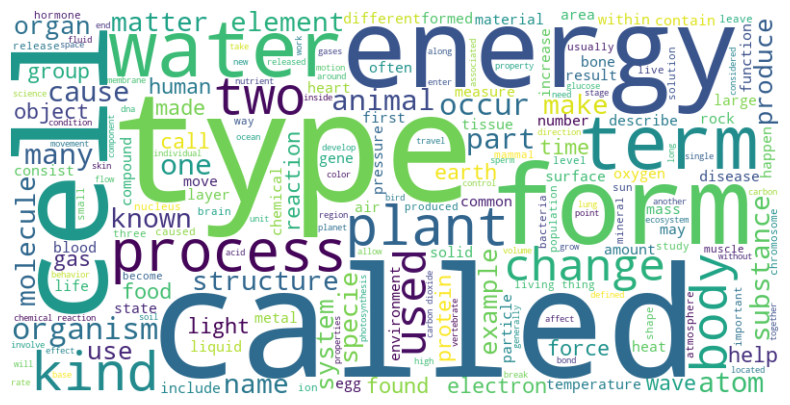

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Combine the datasets
combined_data_SciQ = pd.concat([train_data, test_data, valid_data])

# Function to generate a combined word cloud for all subjects
def generate_combined_word_cloud(data, data_name, column='question'):
    print(f"Generating word cloud for all subjects in {data_name}")
    text = ' '.join(data[column].astype(str).tolist())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Wordcloud of 'Question' column for each subject
def generate_word_clouds(data, data_name, column='question'):
    subjects = data['subject'].unique()
    for subject in subjects:
        print(f"Generating word cloud for subject named {subject} in {data_name}")
        text = ' '.join(data[data['subject'] == subject][column].astype(str).tolist())
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.show()

# Generate word clouds for the 'question' column in each dataset
print("Combined Data:")
generate_combined_word_cloud(combined_data_SciQ, "Combined Data")

In [34]:
# Generate wordcloud of SciQ train dataset
import pandas as pd

# Add a new column to each dataset to identify their origin
test_data['dataset'] = 'Test'
train_data['dataset'] = 'Train'
valid_data['dataset'] = 'Valid'

# Combine the datasets
combined_data = pd.concat([train_data, test_data, valid_data])

# Calculate the counts for each dataset
all_count = combined_data.shape[0]
train_count = combined_data[combined_data['dataset'] == 'Train'].shape[0]
valid_count = combined_data[combined_data['dataset'] == 'Valid'].shape[0]
test_count = combined_data[combined_data['dataset'] == 'Test'].shape[0]

# Create a DataFrame to display the counts
counts_df_SciQ = pd.DataFrame({
    'Dataset': ['ALL', 'Train', 'Valid', 'Test'],
    'Count': [all_count, train_count, valid_count, test_count]
})

# Display the counts as a table
print(counts_df_SciQ)

  Dataset  Count
0     ALL  13679
1   Train  11679
2   Valid   1000
3    Test   1000


In [35]:
test_data.head()

,question,distractor3,distractor1,distractor2,correct_answer,support,dataset
0,Compounds that are capable of accepting electr...,residues,antioxidants,Oxygen,oxidants,Oxidants and Reductants Compounds that are cap...,Test
1,What term in biotechnology means a genetically...,phenotype,adult,male,clone,But transgenic animals just have one novel gen...,Test
2,Vertebrata are characterized by the presence o...,Thumbs,Bones,Muscles,backbone,Figure 29.7 Vertebrata are characterized by th...,Test
3,What is the height above or below sea level ca...,variation,depth,latitude,elevation,"As you know, the surface of Earth is not flat....",Test
4,"Ice cores, varves and what else indicate the e...",magma,mountain ranges,fossils,tree rings,"Tree rings, ice cores, and varves indicate the...",Test


In [36]:
train_data.head()

,question,distractor3,distractor1,distractor2,correct_answer,support,dataset
0,What type of organism is commonly used in prep...,viruses,protozoa,gymnosperms,mesophilic organisms,"Mesophiles grow best in moderate temperature, ...",Train
1,What phenomenon makes global winds blow northe...,tropical effect,muon effect,centrifugal effect,coriolis effect,Without Coriolis Effect the global winds would...,Train
2,Changes from a less-ordered state to a more-or...,endothermic,unbalanced,reactive,exothermic,Summary Changes of state are examples of phase...,Train
3,What is the least dangerous radioactive decay?,zeta decay,beta decay,gamma decay,alpha decay,All radioactive decay is dangerous to living t...,Train
4,Kilauea in hawaii is the world’s most continuo...,magma,greenhouse gases,carbon and smog,smoke and ash,Example 3.5 Calculating Projectile Motion: Hot...,Train


In [37]:
valid_data.head()

,question,distractor3,distractor1,distractor2,correct_answer,support,dataset
0,Who proposed the theory of evolution by natura...,Scopes,Linnaeus,shaw,darwin,,Valid
1,Each specific polypeptide has a unique linear ...,hydrochloric,fatty,lactic,amino,,Valid
2,A frameshift mutation is a deletion or inserti...,genes,proteins,carotenoids,nucleotides,A frameshift mutation is a deletion or inserti...,Valid
3,What is an area of land called that is wet for...,tundra,plains,grassland,wetland,A wetland is an area that is wet for all or pa...,Valid
4,Surface waters are heated by the radiation from?,gamma rays,decomposition,the moon,the sun,,Valid


## Show distribution of SciQ dataset

In [38]:
import matplotlib.pyplot as plt

# Combined question and hint length
combined_data_SciQ['question_length'] = combined_data_SciQ['question'].apply(lambda x: len(x))
combined_data_SciQ['correct_answer_length'] = combined_data_SciQ['correct_answer'].apply(lambda x: len(x))

# train, test, validation question length
train_data['question_length'] = train_data['question'].apply(len)
test_data['question_length'] = test_data['question'].apply(len)
valid_data['question_length'] = valid_data['question'].apply(len)

# train, test, validation solution length
train_data['correct_answer_length'] = train_data['correct_answer'].apply(len)
test_data['correct_answer_length'] = test_data['correct_answer'].apply(len)
valid_data['correct_answer_length'] = valid_data['correct_answer'].apply(len)

# Create data list of ScienceQa
data_to_plot_qa_SciQ = [combined_data_SciQ['question_length'], train_data['question_length'], valid_data['question_length'], test_data['question_length']]
data_to_plot_correct_answer_SciQ = [combined_data_SciQ['correct_answer_length'], train_data['correct_answer_length'], valid_data['correct_answer_length'], test_data['correct_answer_length']]

Box plot of question lengths in SciQ dataset


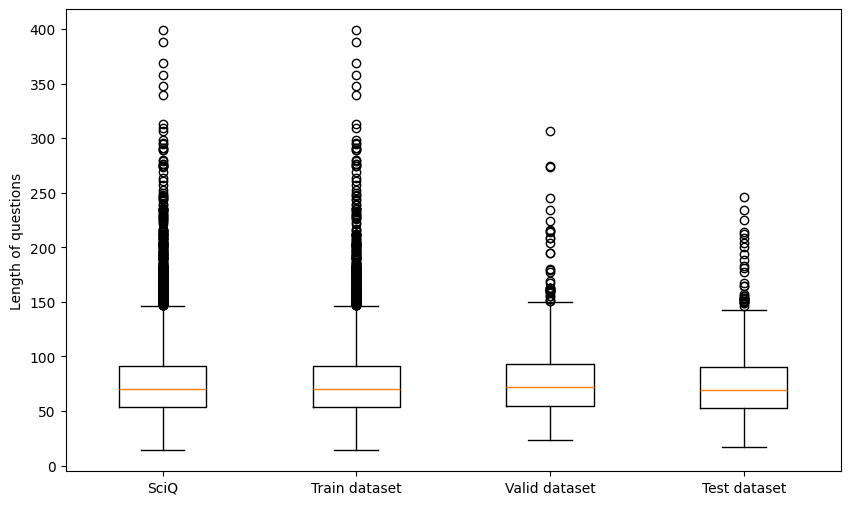

In [39]:
#Question length box plot
print('Box plot of question lengths in SciQ dataset')
plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot_qa_SciQ)
plt.ylabel('Length of questions')
plt.xticks([1, 2, 3, 4], ['SciQ', 'Train dataset', 'Valid dataset','Test dataset'])
plt.show()

Box plot of correct answer lengths in SciQ dataset


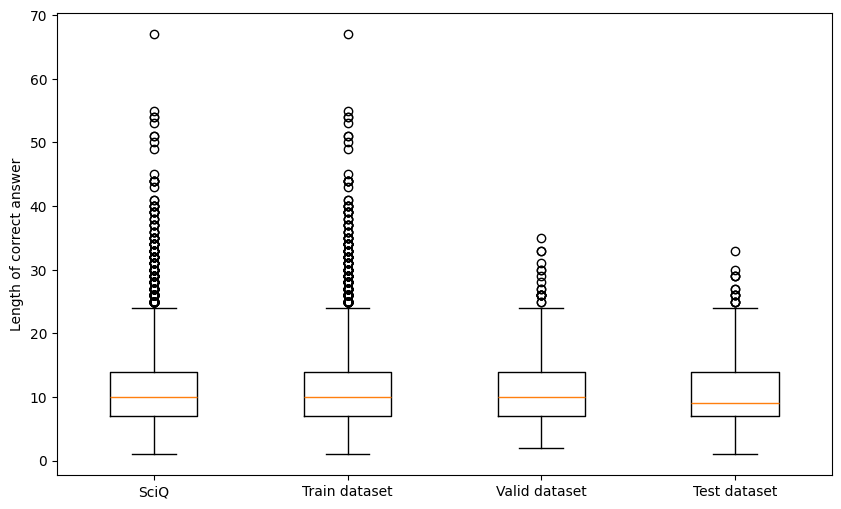

In [40]:
#Solution length box plot
print(('Box plot of correct answer lengths in SciQ dataset'))
plt.figure(figsize=(10, 6))
plt.boxplot(data_to_plot_correct_answer_SciQ)
plt.ylabel('Length of correct answer')
plt.xticks([1, 2, 3, 4], ['SciQ', 'Train dataset',  'Valid dataset', 'Test dataset'])
plt.show()

In [41]:
# train data Question length
combined_data_SciQ['question_length'] = combined_data_SciQ['question'].apply(len)

length_question = combined_data_SciQ['question_length'].describe()
median_length_question = combined_data_SciQ['question_length'].median()

length_question

count    13679.000000
mean        76.148987
std         31.937178
min         14.000000
25%         54.000000
50%         70.000000
75%         91.000000
max        399.000000
Name: question_length, dtype: float64

In [42]:
print(f'median question length of SciQ data: {median_length_question}')

median question length of SciQ data: 70.0


In [43]:
combined_data_SciQ['correct_answer_length'] = combined_data_SciQ['correct_answer'].apply(len)

length_question = combined_data_SciQ['correct_answer_length'].describe()
median_length_correct_answer = combined_data_SciQ['correct_answer_length'].median()

length_question

count    13679.000000
mean        11.008042
std          5.630331
min          1.000000
25%          7.000000
50%         10.000000
75%         14.000000
max         67.000000
Name: correct_answer_length, dtype: float64

In [44]:
print(f'median question length of SciQ data: {median_length_correct_answer}')

median question length of SciQ data: 10.0


In [45]:
# train data Question length
train_data['question_length'] = train_data['question'].apply(len)

length_train_question = train_data['question_length'].describe()
median_length_train_question = train_data['question_length'].median()

length_train_question

count    11679.000000
mean        76.009932
std         31.856469
min         14.000000
25%         54.000000
50%         70.000000
75%         91.000000
max        399.000000
Name: question_length, dtype: float64

In [46]:
print(f'median question length of train data: {median_length_train_question}')

median question length of train data: 70.0


In [47]:
# train data correct answer length
train_data['correct_answer_length'] = train_data['correct_answer'].apply(len)

length_train_correct = train_data['correct_answer_length'].describe()
median_length_train_correct = train_data['correct_answer_length'].median()

length_train_correct

count    11679.000000
mean        11.037332
std          5.689139
min          1.000000
25%          7.000000
50%         10.000000
75%         14.000000
max         67.000000
Name: correct_answer_length, dtype: float64

In [48]:
print(f'median correct answer length of train data: {median_length_train_correct}')

median correct answer length of train data: 10.0


In [49]:
# test data Question length
test_data['question_length'] = test_data['question'].apply(len)

length_test_question = test_data['question_length'].describe()
median_length_test_question = test_data['question_length'].median()

length_test_question

count    1000.0000
mean       75.8830
std        31.3642
min        17.0000
25%        53.0000
50%        69.0000
75%        90.0000
max       246.0000
Name: question_length, dtype: float64

In [50]:
print(f'median question length of test data: {median_length_test_question}')

median question length of test data: 69.0


In [51]:
test_data['correct_answer_length'] = test_data['correct_answer'].apply(len)

length_test_qa = test_data['correct_answer_length'].describe()
median_length_test_correct = test_data['correct_answer_length'].median()

length_test_qa

count    1000.000000
mean       10.511000
std         5.189297
min         1.000000
25%         7.000000
50%         9.000000
75%        14.000000
max        33.000000
Name: correct_answer_length, dtype: float64

In [52]:
print(f'median correct answer length of test data: {median_length_test_correct}')

median correct answer length of test data: 9.0


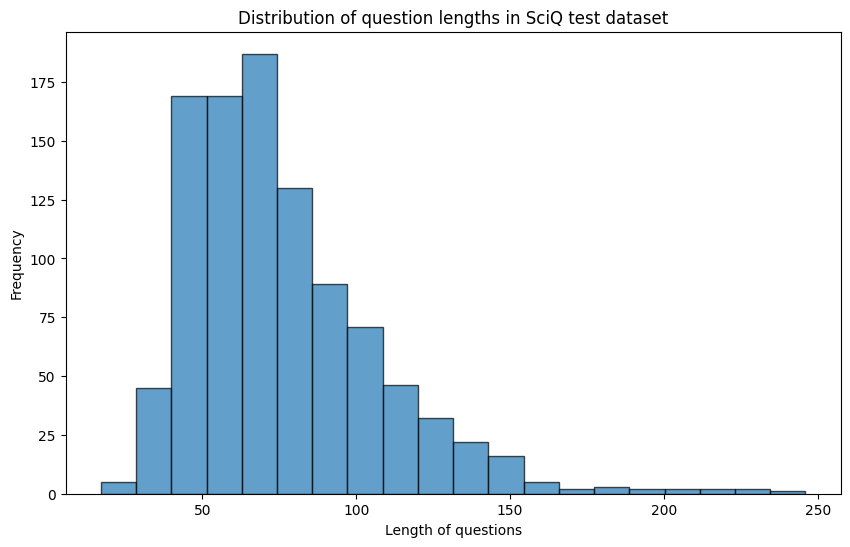

In [53]:
import matplotlib.pyplot as plt

# test dataset histogram
plt.figure(figsize=(10, 6))
plt.hist(test_data['question_length'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of question lengths in SciQ test dataset')
plt.xlabel('Length of questions')
plt.ylabel('Frequency')
plt.show()

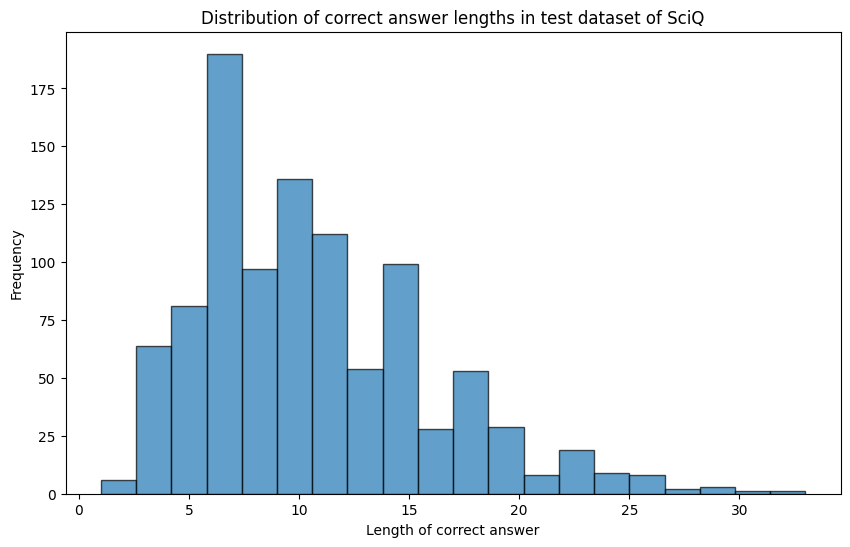

In [54]:
import matplotlib.pyplot as plt

# test dataset histogram
plt.figure(figsize=(10, 6))
plt.hist(test_data['correct_answer_length'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of correct answer lengths in test dataset of SciQ')
plt.xlabel('Length of correct answer')
plt.ylabel('Frequency')
plt.show()

In [55]:
# SciQ train data question length
train_data['question_length'] = train_data['question'].apply(len)

length_test_qa = train_data['question_length'].describe()

print("Question length of SciQ train dataset")

length_test_qa

Question length of SciQ train dataset


count    11679.000000
mean        76.009932
std         31.856469
min         14.000000
25%         54.000000
50%         70.000000
75%         91.000000
max        399.000000
Name: question_length, dtype: float64

In [56]:
# SciQ train data correct answer length
train_data['correct_answer_length'] = train_data['correct_answer'].apply(len)

length_test_qa = train_data['correct_answer_length'].describe()

print("Correct answer length of SciQ train dataset")

length_test_qa

Correct answer length of SciQ train dataset


count    11679.000000
mean        11.037332
std          5.689139
min          1.000000
25%          7.000000
50%         10.000000
75%         14.000000
max         67.000000
Name: correct_answer_length, dtype: float64

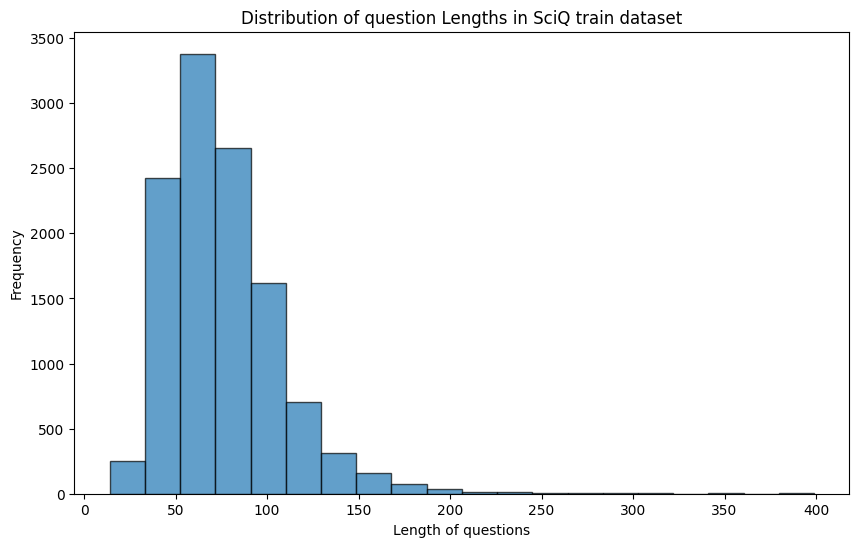

In [57]:
import matplotlib.pyplot as plt

# histogram of question in SciQ train dataset
plt.figure(figsize=(10, 6))
plt.hist(train_data['question_length'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of question Lengths in SciQ train dataset')
plt.xlabel('Length of questions')
plt.ylabel('Frequency')
plt.show()


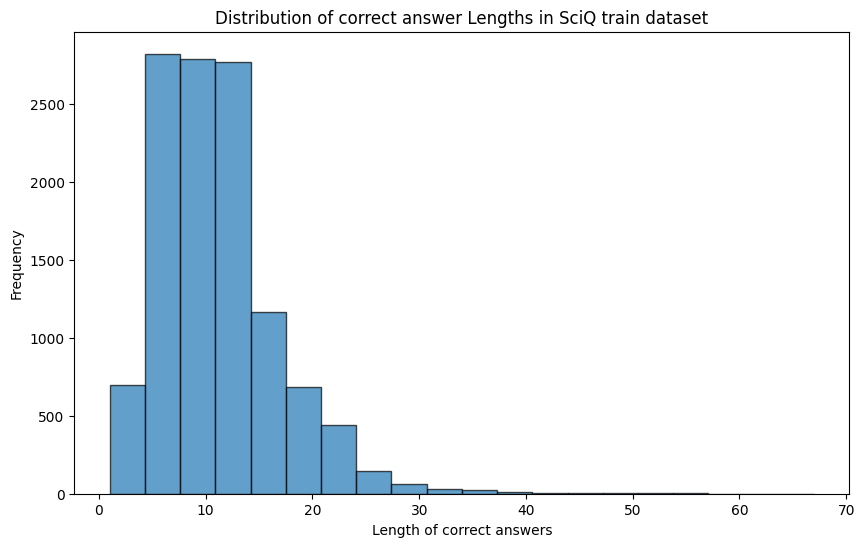

In [58]:
import matplotlib.pyplot as plt

# histogram of question in SciQ train dataset
plt.figure(figsize=(10, 6))
plt.hist(train_data['correct_answer_length'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of correct answer Lengths in SciQ train dataset')
plt.xlabel('Length of correct answers')
plt.ylabel('Frequency')
plt.show()


In [59]:
# Question length of SciQ valid dataset
valid_data['question_length'] = valid_data['question'].apply(len)

length_stats = valid_data['question_length'].describe()

print("Question length of SciQ validation dataset")
length_stats


Question length of SciQ validation dataset


count    1000.000000
mean       78.039000
std        33.385777
min        23.000000
25%        55.000000
50%        72.000000
75%        93.000000
max       307.000000
Name: question_length, dtype: float64

In [60]:
# Question length of SciQ valid dataset
valid_data['correct_answer_length'] = valid_data['correct_answer'].apply(len)

length_stats = valid_data['correct_answer_length'].describe()

print("Correct answer length of SciQ validation dataset")
length_stats


Correct answer length of SciQ validation dataset


count    1000.000000
mean       11.163000
std         5.336001
min         2.000000
25%         7.000000
50%        10.000000
75%        14.000000
max        35.000000
Name: correct_answer_length, dtype: float64

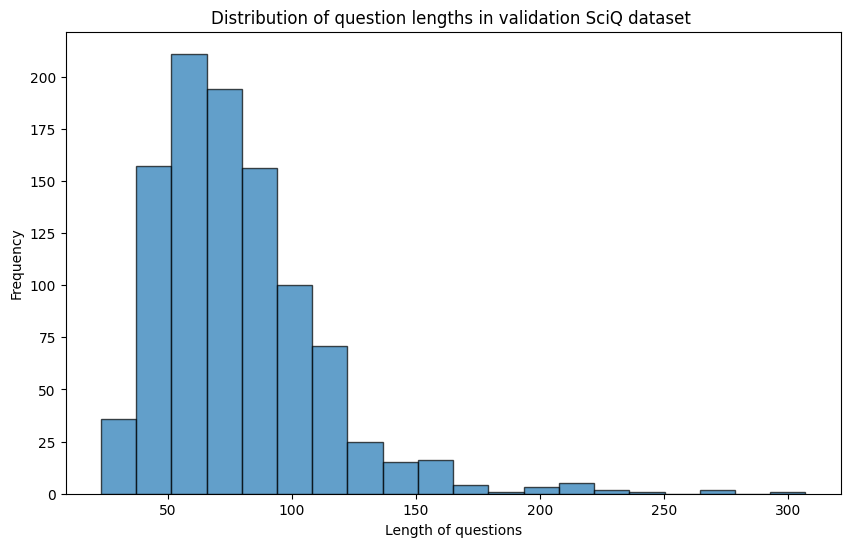

In [61]:
import matplotlib.pyplot as plt

# histogram of question length in validation SciQ dataset
plt.figure(figsize=(10, 6))
plt.hist(valid_data['question_length'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of question lengths in validation SciQ dataset ')
plt.xlabel('Length of questions')
plt.ylabel('Frequency')
plt.show()

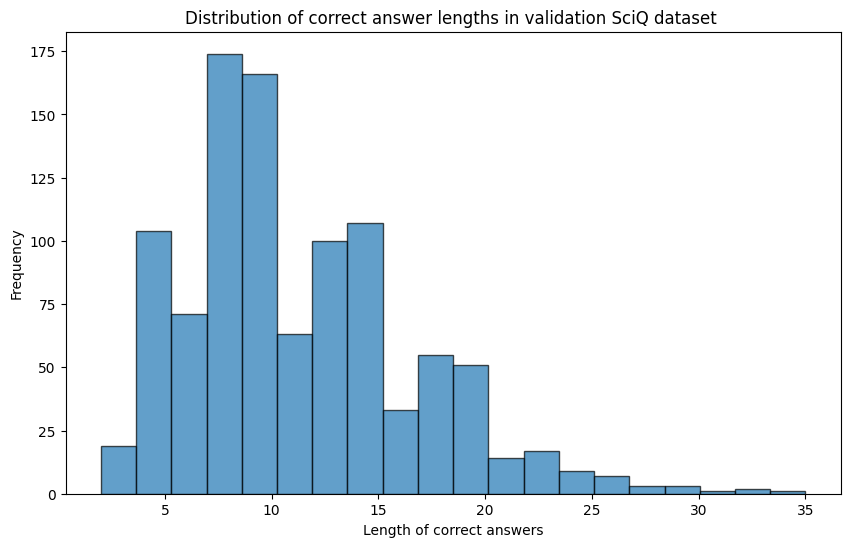

In [62]:
import matplotlib.pyplot as plt

# histogram of question length in validation SciQ dataset
plt.figure(figsize=(10, 6))
plt.hist(valid_data['correct_answer_length'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of correct answer lengths in validation SciQ dataset ')
plt.xlabel('Length of correct answers')
plt.ylabel('Frequency')
plt.show()
